In [9]:
import pandas as pd
import matplotlib.pyplot as plt

Remove zero values to clean data.

In [10]:
df = pd.read_csv('nrg_cb_oilm_linear.csv')
df['TIME_PERIOD'] = [int(x[:4]) * 12 + int(x[5:]) - 1 for x in df['TIME_PERIOD']]
df = df[df['OBS_VALUE'] != 0]
df.sort_values(['geo', 'nrg_bal', 'unit', 'TIME_PERIOD'], inplace=True)

In [11]:
tpmin, tpmax = df['TIME_PERIOD'].min(), df['TIME_PERIOD'].max()

Display data for first countries and each siec & energy balance.

C:\Users\Utente\AppData\Local\Temp\ipykernel_15544\2366085099.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  filtered_df = df_by_geo[(df['nrg_bal'] == nrg_bal) & (df['siec'] == siec)]


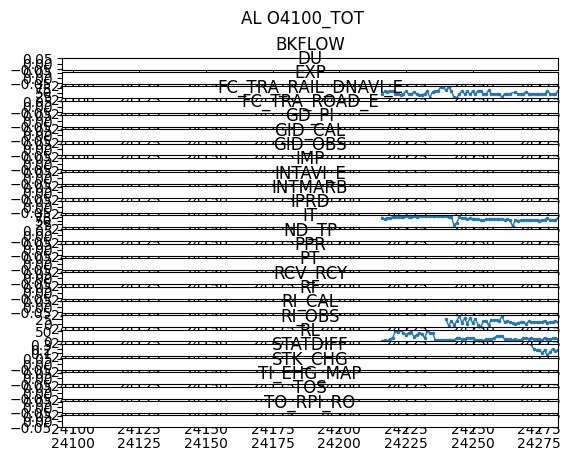

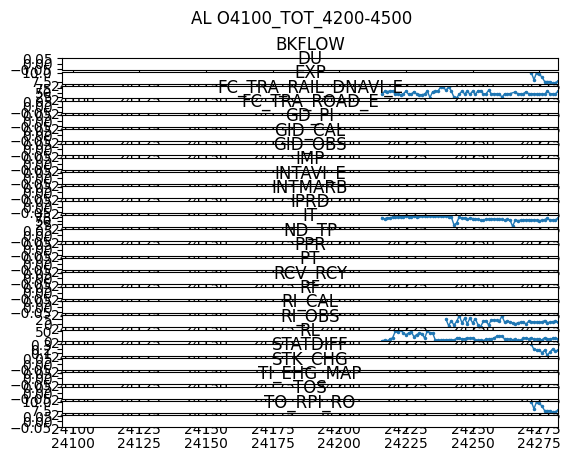

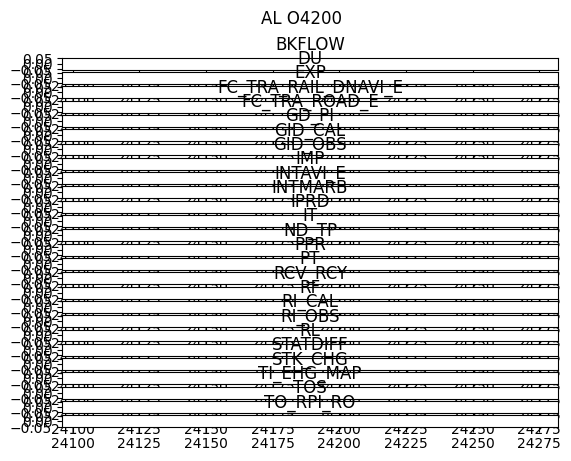

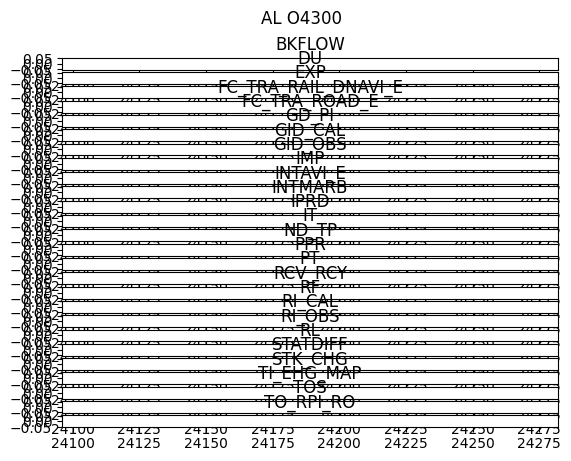

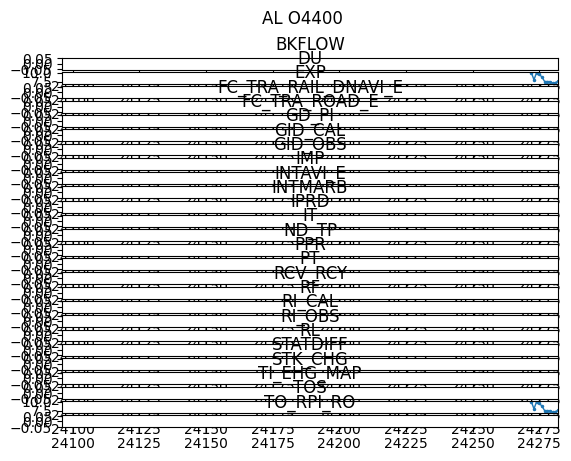

...

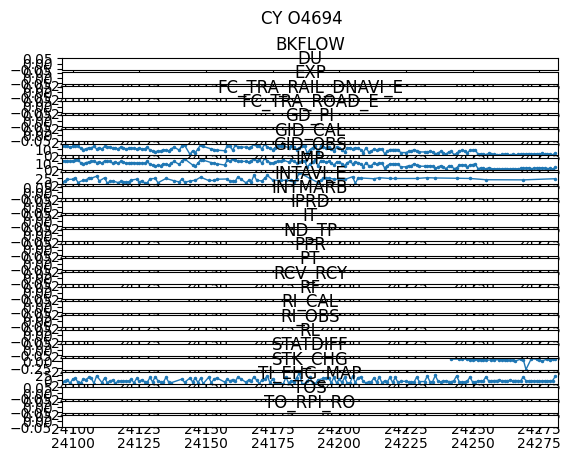

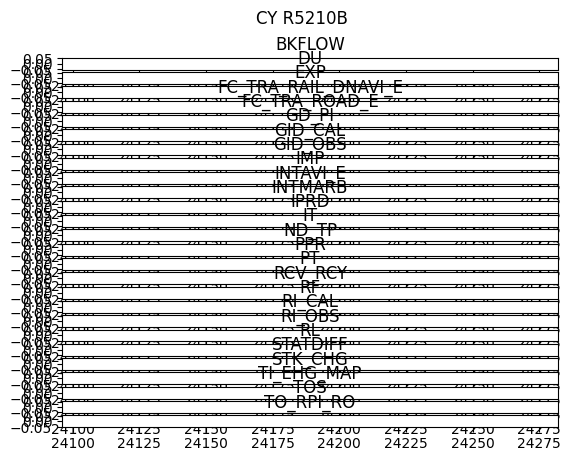

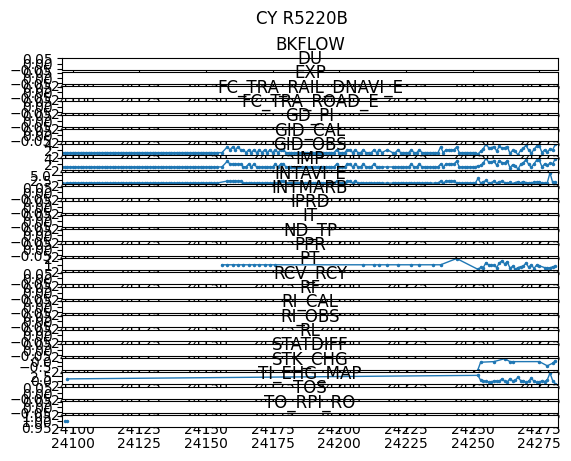

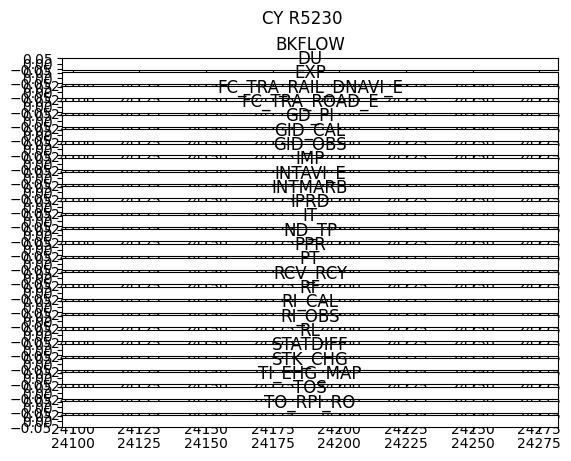

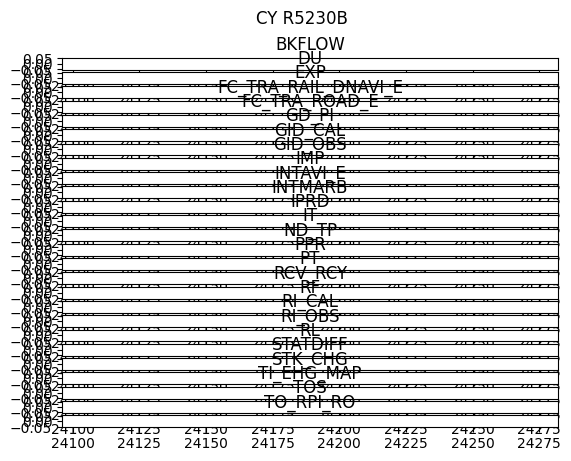

In [12]:
geos = sorted(df['geo'].unique())
nrg_bals = sorted(df['nrg_bal'].unique())
siecs = sorted(df['siec'].unique())
for geo in geos[:5]:
    df_by_geo = df[df['geo'] == geo]
    for siec in siecs:
        fig, axs = plt.subplots(len(nrg_bals))
        fig.suptitle(f'{geo} {siec}')
        for i in range(len(nrg_bals)):
            nrg_bal = nrg_bals[i]
            filtered_df = df_by_geo[(df['nrg_bal'] == nrg_bal) & (df['siec'] == siec)]
            axs[i].set_title(nrg_bal)
            axs[i].set_xlim([tpmin, tpmax])
            axs[i].plot(filtered_df['TIME_PERIOD'], filtered_df['OBS_VALUE'], marker='.', ms=3, linewidth=1)
        plt.show()

After removing zero values, some countries show dirty data.

Many time series are missing at all, many show missing values.

All countries show a few data.

In [13]:
df[df['TIME_PERIOD'] >= 2023*12+(7-1)]

,DATAFLOW,LAST UPDATE,freq,nrg_bal,siec,unit,geo,TIME_PERIOD,OBS_VALUE,OBS_FLAG
132122,ESTAT:NRG_CB_OILM(1.0),31/08/23 23:00:00,M,DU,O4100_TOT_4200-4500,THS_T,AL,24282,7.600,NaN
146990,ESTAT:NRG_CB_OILM(1.0),31/08/23 23:00:00,M,DU,O4400,THS_T,AL,24282,7.600,NaN
152769,ESTAT:NRG_CB_OILM(1.0),31/08/23 23:00:00,M,DU,O4410,THS_T,AL,24282,7.600,NaN
163919,ESTAT:NRG_CB_OILM(1.0),31/08/23 23:00:00,M,EXP,O4100_TOT,THS_T,AL,24282,57.658,NaN
169522,ESTAT:NRG_CB_OILM(1.0),31/08/23 23:00:00,M,EXP,O4100_TOT_4200-4500,THS_T,AL,24282,57.658,NaN
...,...,...,...,...,...,...,...,...,...,...
2194592,ESTAT:NRG_CB_OILM(1.0),31/08/23 23:00:00,M,TO_RPI_RO,O4671XR5220B,THS_T,PT,24282,361.101,NaN
2200145,ESTAT:NRG_CB_OILM(1.0),31/08/23 23:00:00,M,TO_RPI_RO,O4680,THS_T,PT,24282,218.524,NaN
2205963,ESTAT:NRG_CB_OILM(1.0),31/08/23 23:00:00,M,TO_RPI_RO,O4681,THS_T,PT,24282,218.524,NaN
2217576,ESTAT:NRG_CB_OILM(1.0),31/08/23 23:00:00,M,TO_RPI_RO,O4690XO4694,THS_T,PT,24282,10.516,NaN


In [14]:
df[df['TIME_PERIOD'] >= 2023*12+(8-1)]

,DATAFLOW,LAST UPDATE,freq,nrg_bal,siec,unit,geo,TIME_PERIOD,OBS_VALUE,OBS_FLAG


There are no data for August 2023! So a multi-step forecast is mandatory to forecast September 2023.